In [1]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


# Detecting the solar panels in the given images

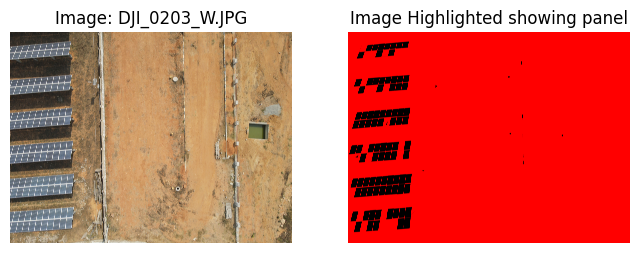

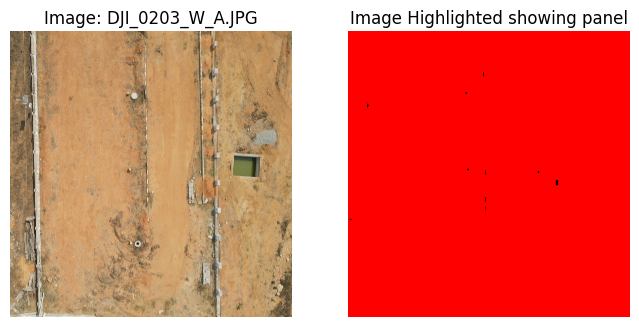

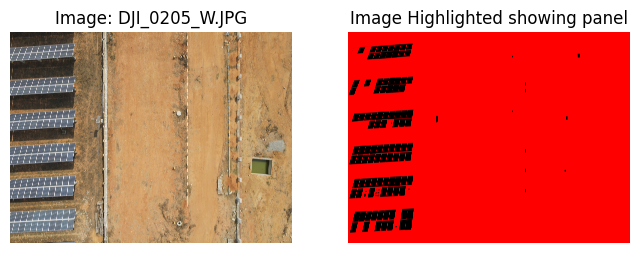

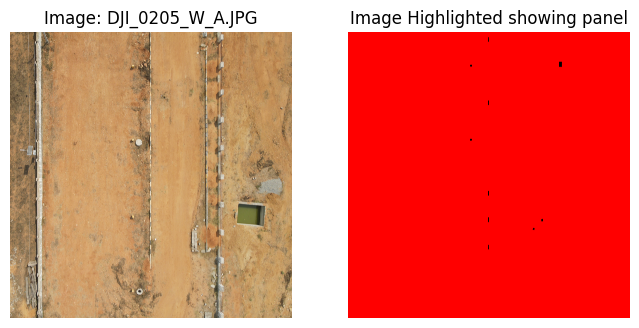

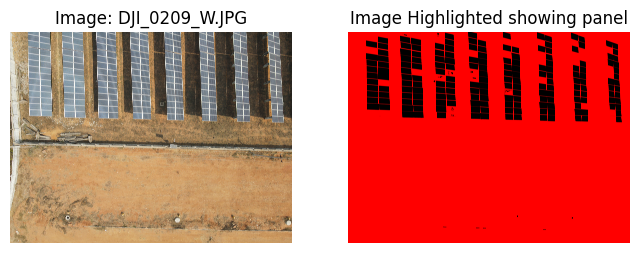

...

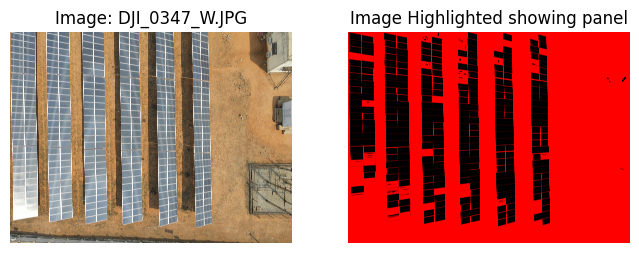

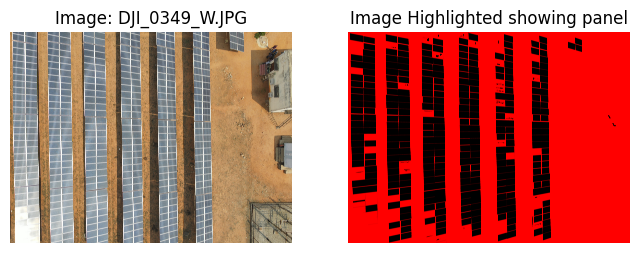

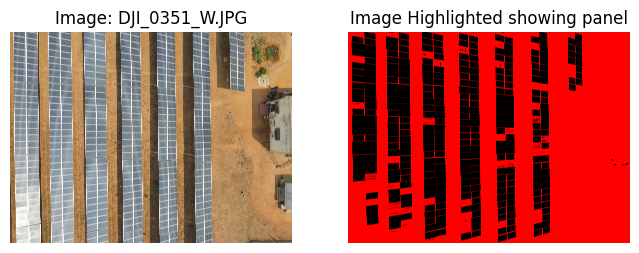

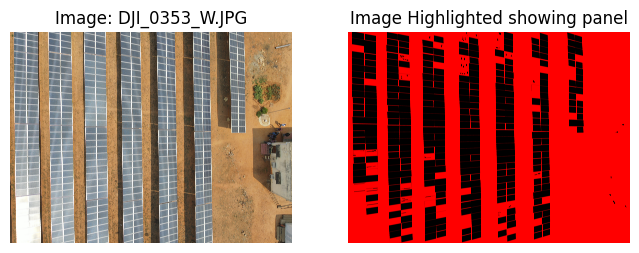

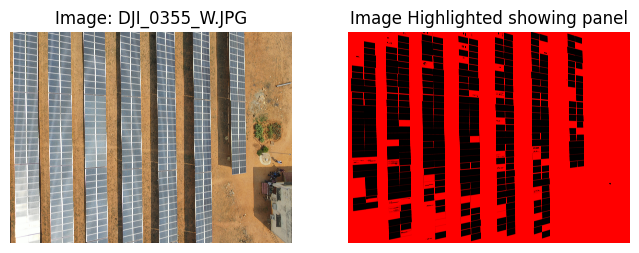

In [2]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to classify an image, return segmented image and bounding boxes
def classify_image(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edges = cv2.Canny(blurred, 50, 150)
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    min_contour_area = 1000
    solar_panels = [cnt for cnt in contours if cv2.contourArea(cnt) > min_contour_area]

    segmented_image = np.zeros_like(image)
    segmented_image[:] = (0, 0, 255)
    cv2.drawContours(segmented_image, solar_panels, -1, (0, 0, 0), -1)

    if len(solar_panels) > 0:
        return True, segmented_image, solar_panels
    else:
        return False, segmented_image, []

# Path to the folder containing the images
data_dir = "C:/Users/Lenovo/OneDrive/Documents/7th sem/EE432/Project-1/images of solar panels"

# Create the "ML_cropped" folder if it doesn't exist
ML_cropped_dir = "C:/Users/Lenovo/OneDrive/Documents/7th sem/EE432/Project-1/ML_Cropped"
os.makedirs(ML_cropped_dir, exist_ok=True)

# Iterate through the images in the folder, classify, and save cropped solar panels
for filename in os.listdir(data_dir):
    if filename.endswith(".JPG"):
        image_path = os.path.join(data_dir, filename)
        
        # Load the image
        image = cv2.imread(image_path)
        
        # Classify the image and get the segmented image and bounding boxes
        has_solar_panel, segmented_image, solar_panels = classify_image(image)
        
        if has_solar_panel:
            for i, panel in enumerate(solar_panels):
                x, y, w, h = cv2.boundingRect(panel)
                # Crop the solar panel from the original image
                solar_panel_cropped = image[y:y+h, x:x+w]
                # Define the path to save the cropped solar panel
                save_path = os.path.join(ML_cropped_dir, f"{filename}_panel{i}.jpg")
                cv2.imwrite(save_path, solar_panel_cropped)

        # Visualize the image and classification
        plt.figure(figsize=(8, 4))
        plt.subplot(121)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"Image: {filename}")
        plt.axis('off')
        
        plt.subplot(122)
        plt.imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
        if has_solar_panel:
            plt.title("Image Highlighted showing panel")
        else:
            plt.title("Class: No Solar Panel")
        plt.axis('off')
        
        plt.show()


# Preparing and Classifying the images According to the dust levels

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Top ten segmented images for class 'Clean':


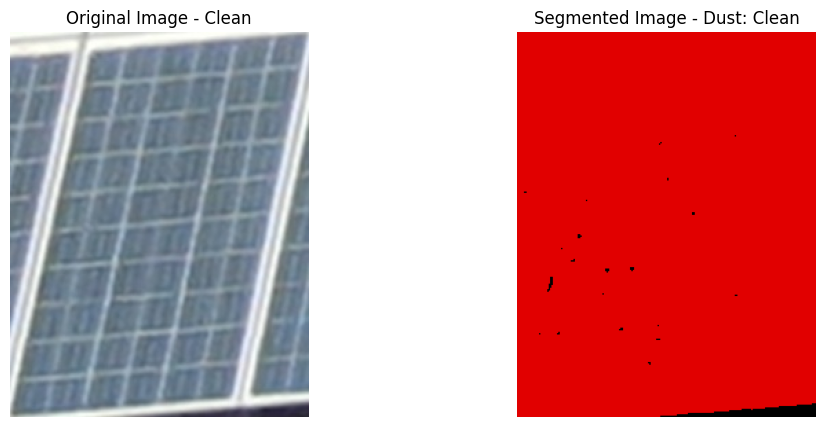

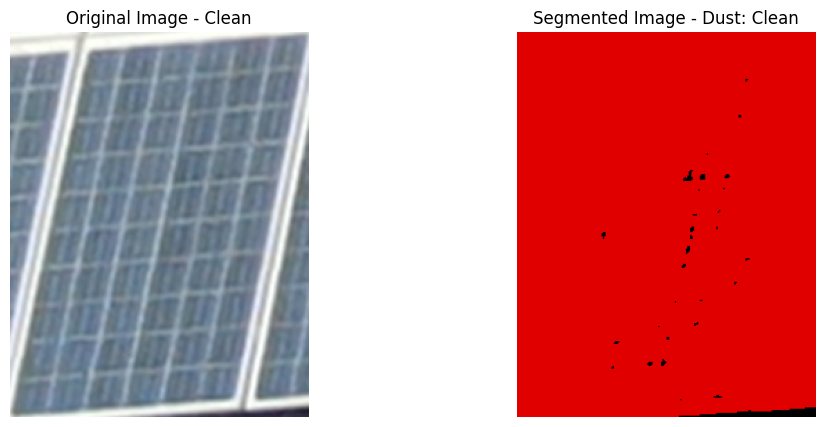

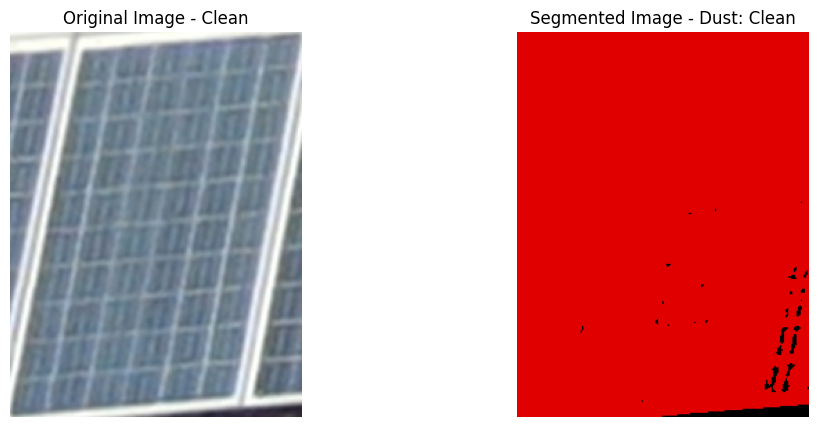

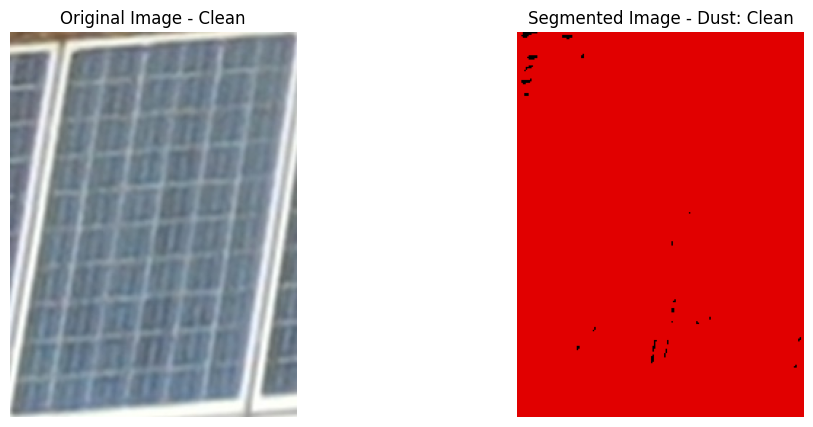

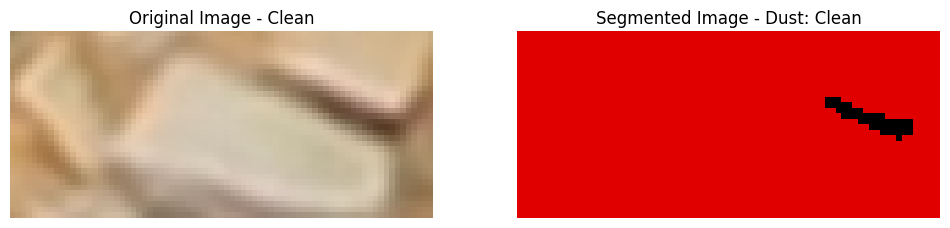

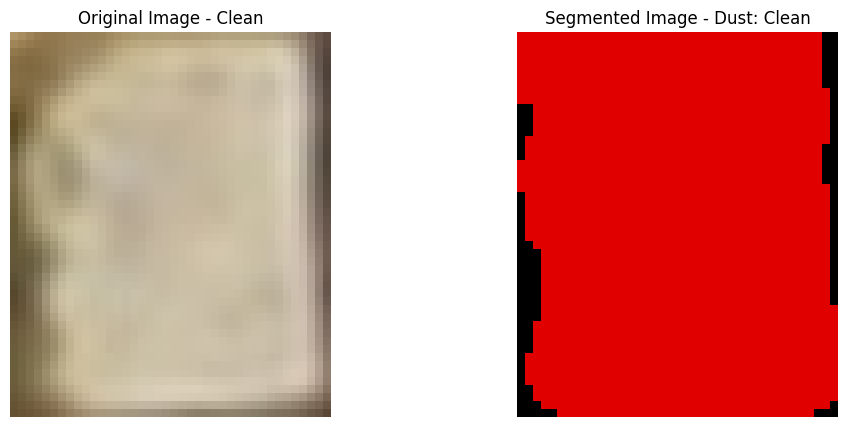

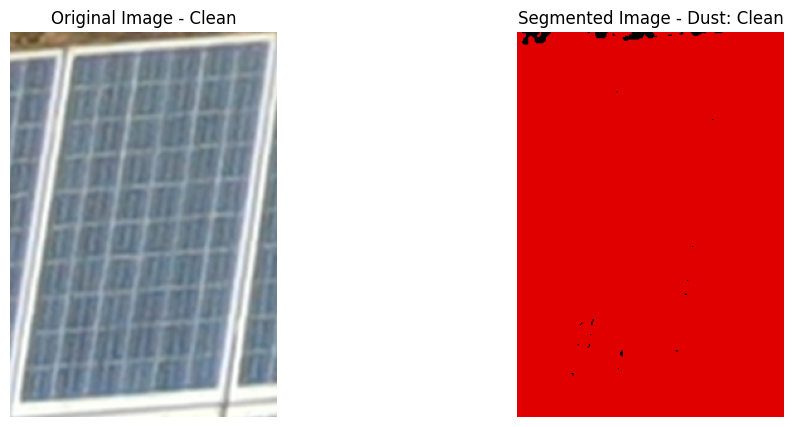

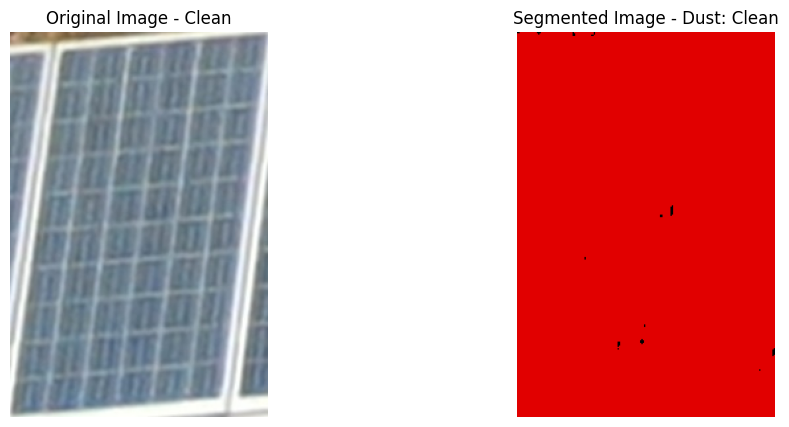

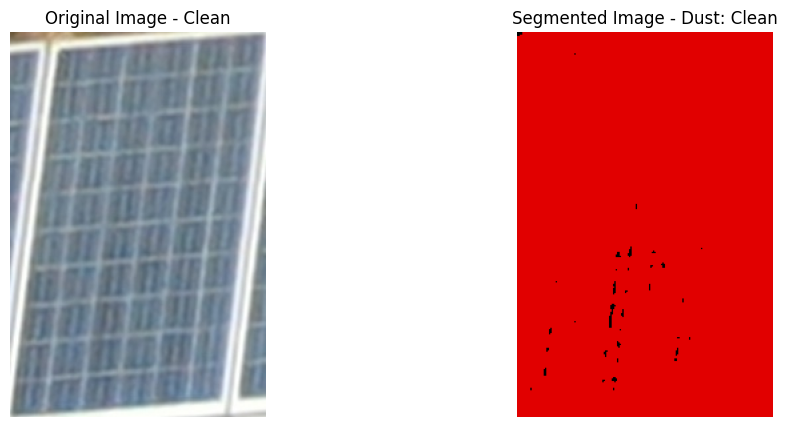

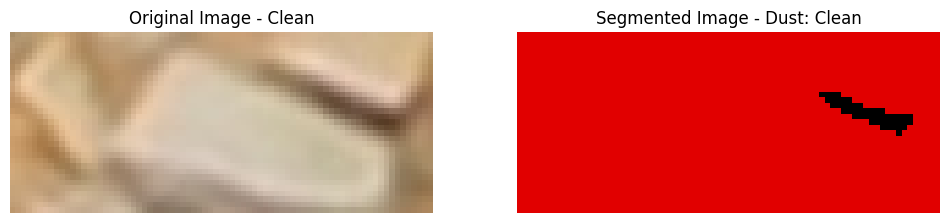

Top ten segmented images for class 'Moderate Dust':


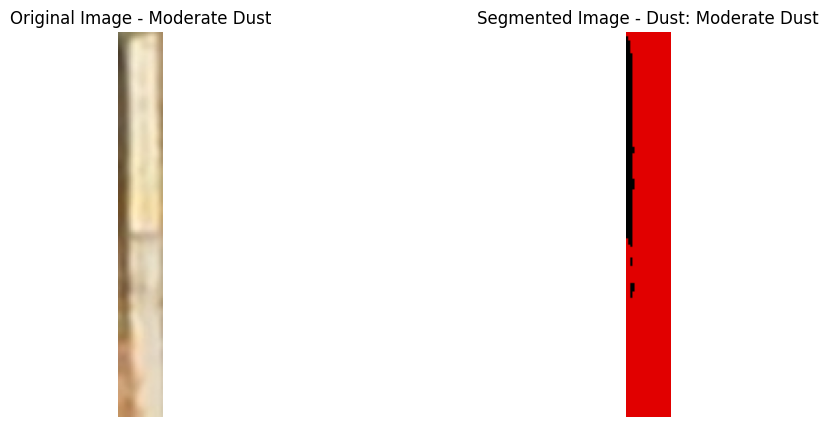

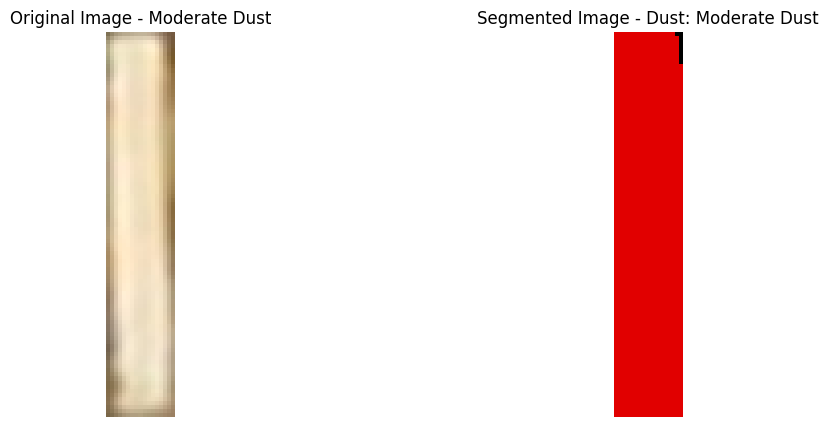

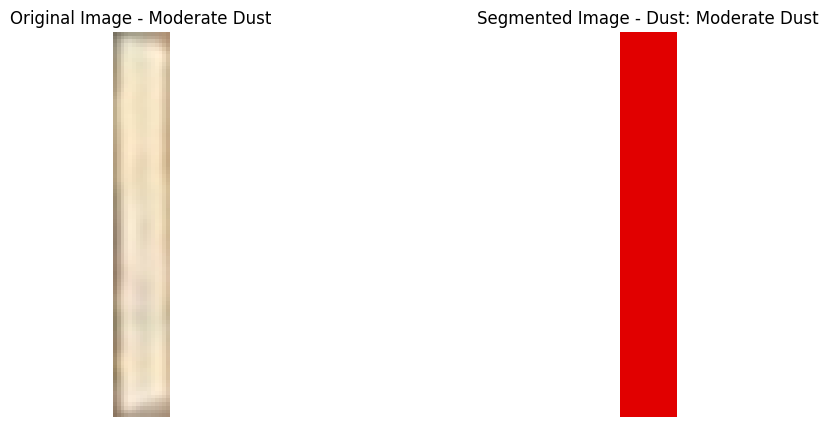

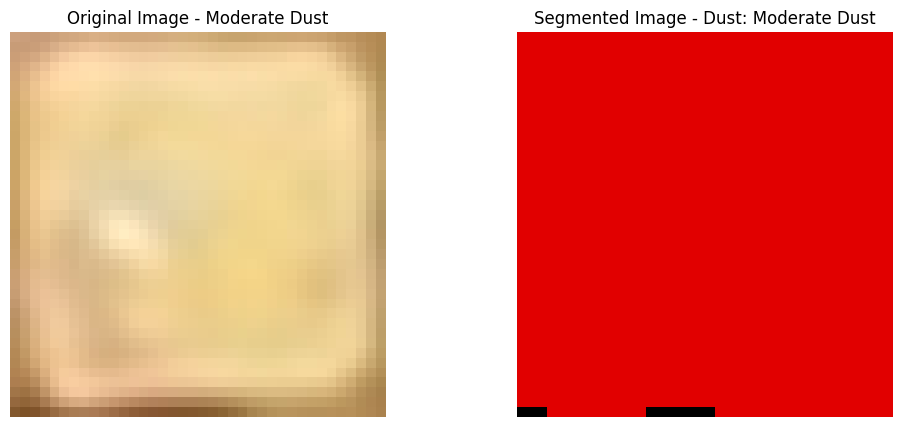

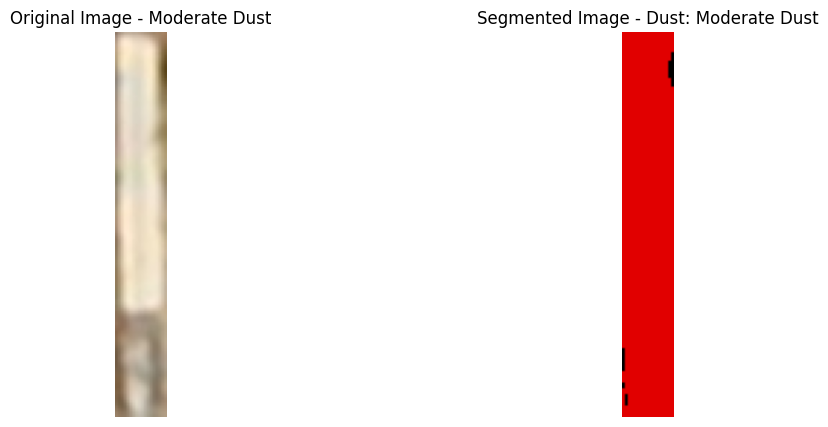

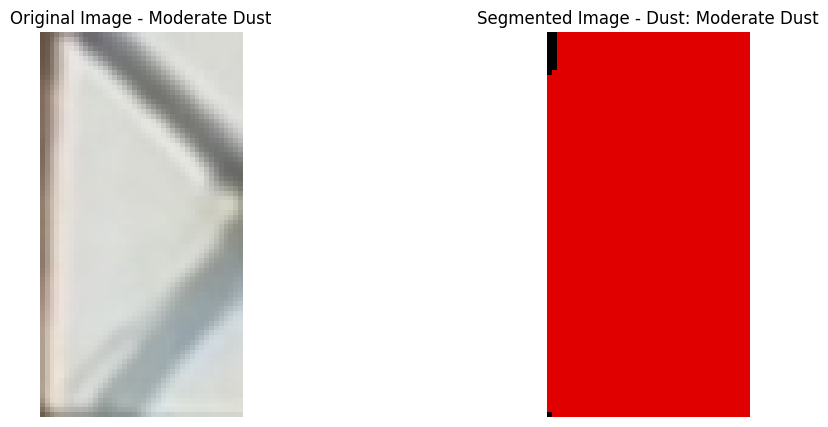

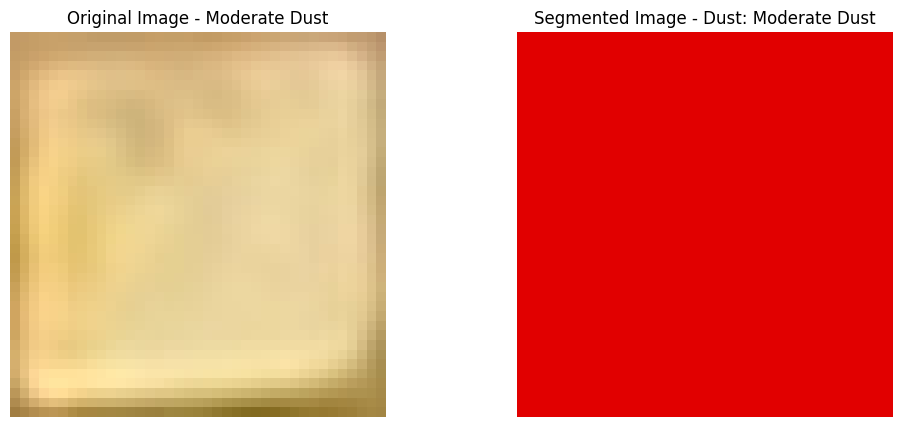

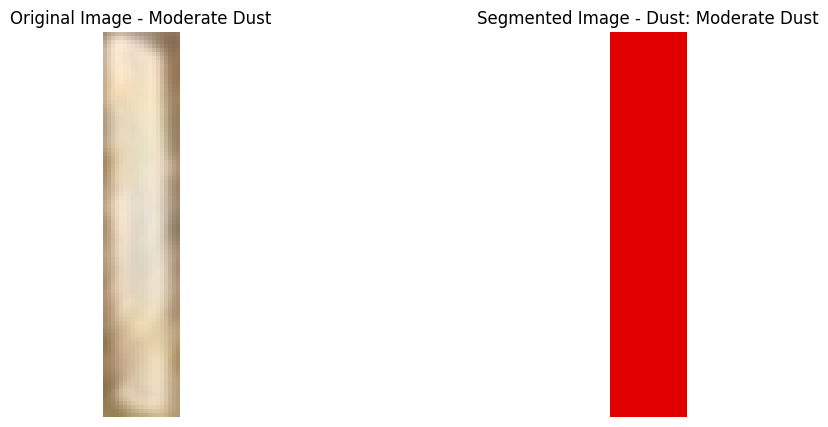

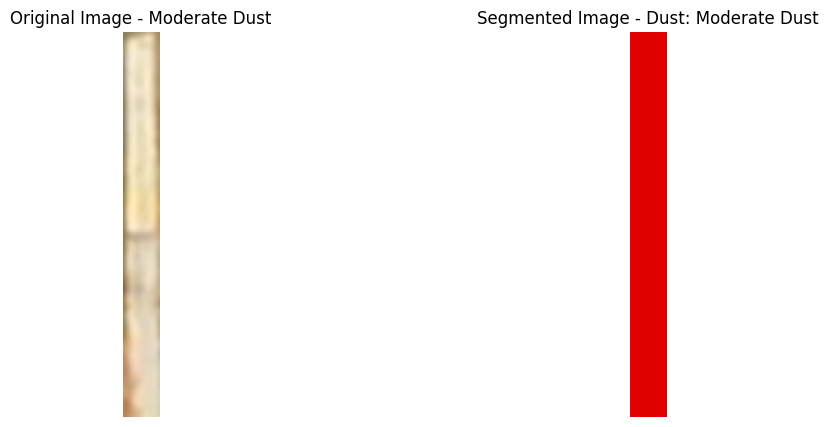

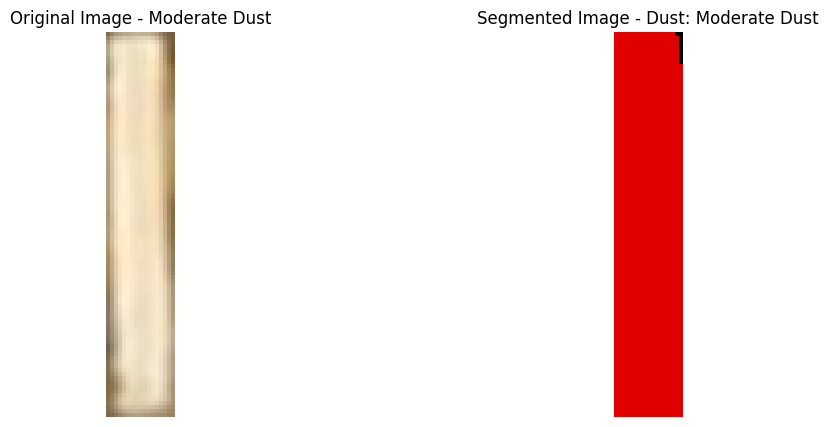

Top ten segmented images for class 'Heavy Dust':


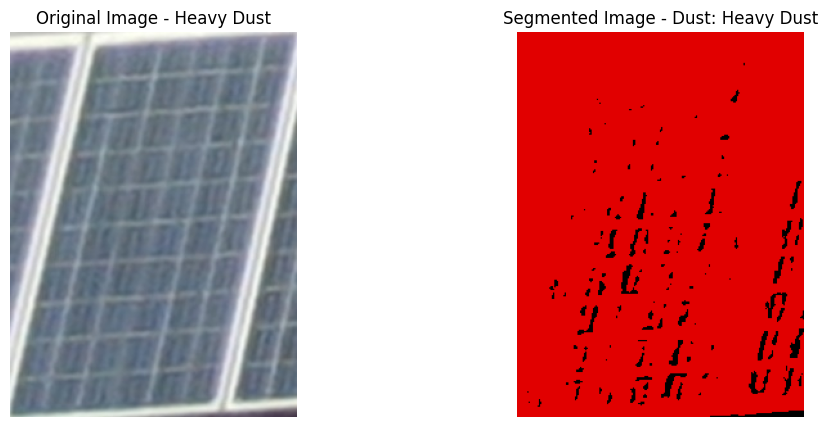

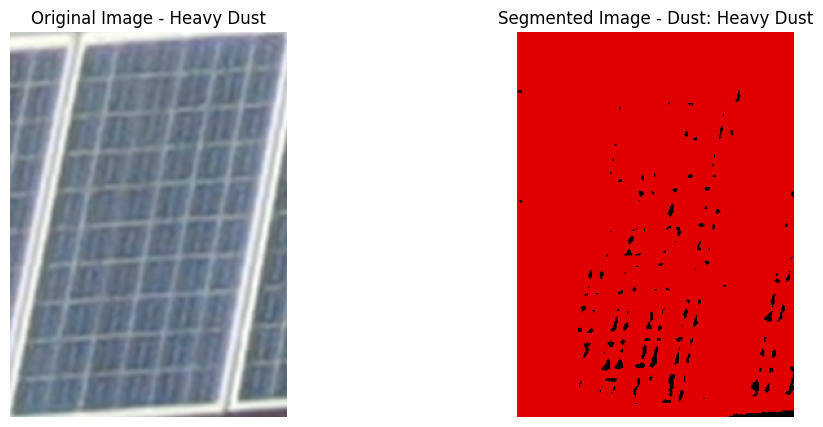

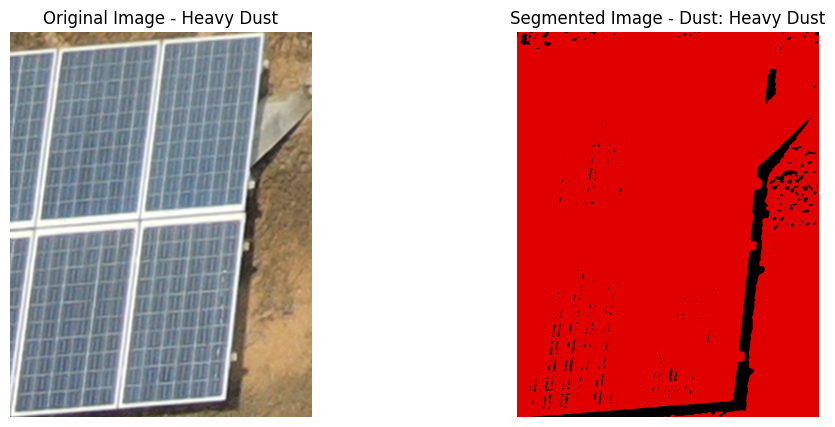

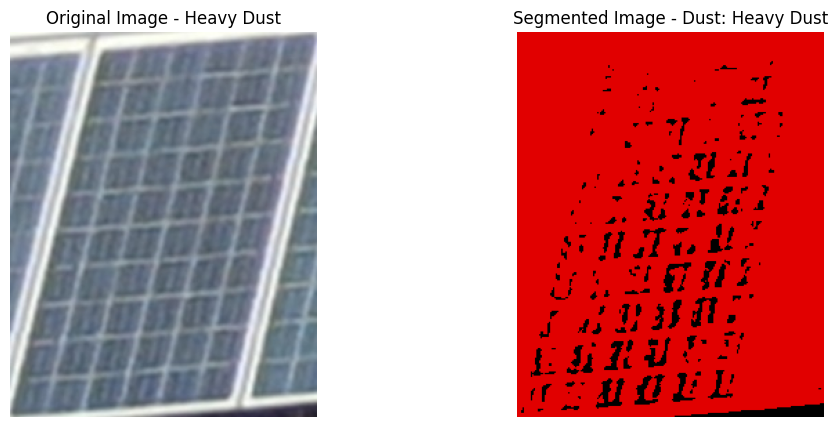

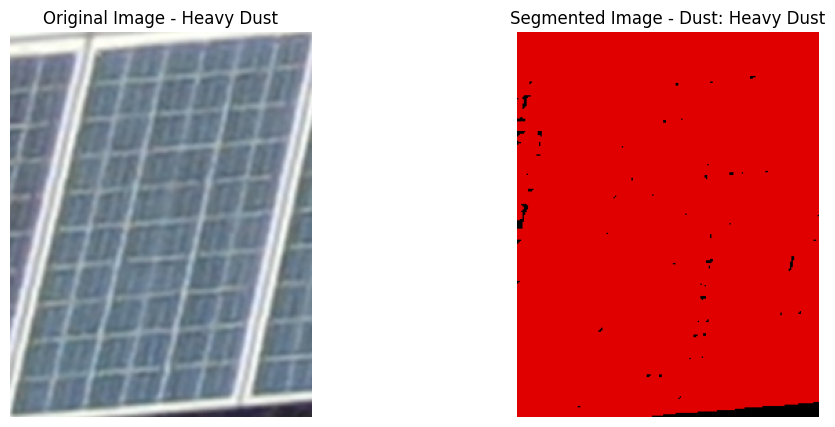

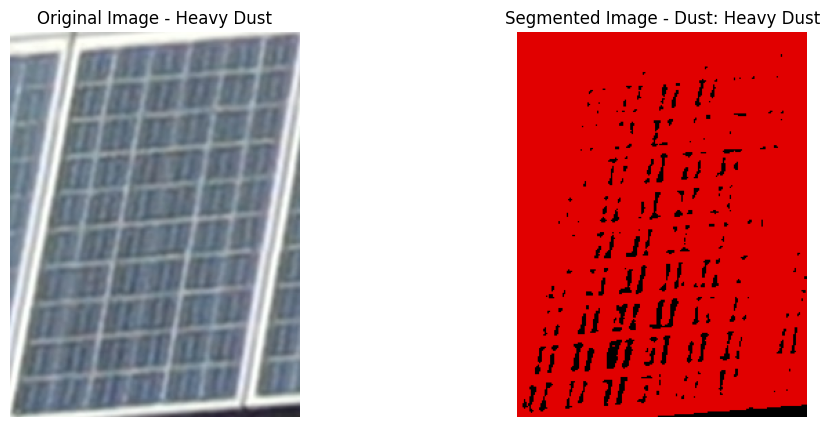

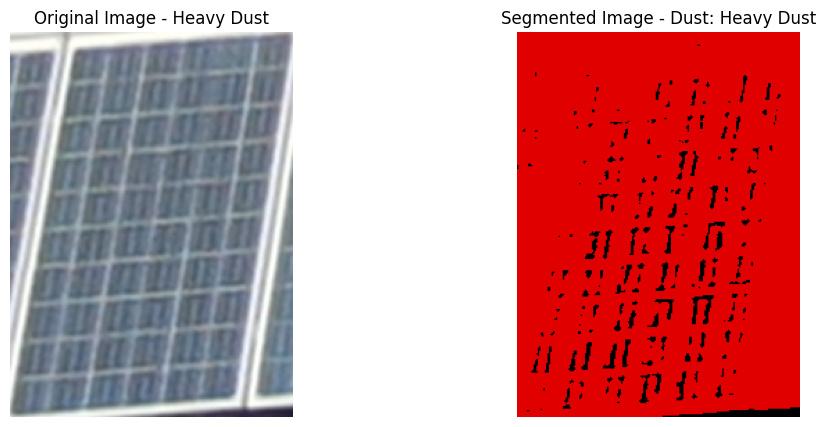

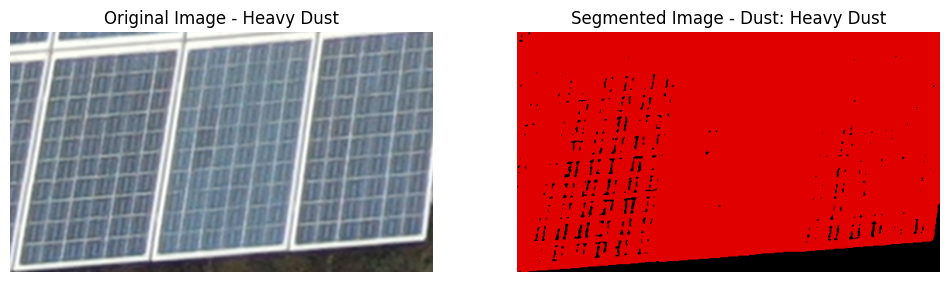

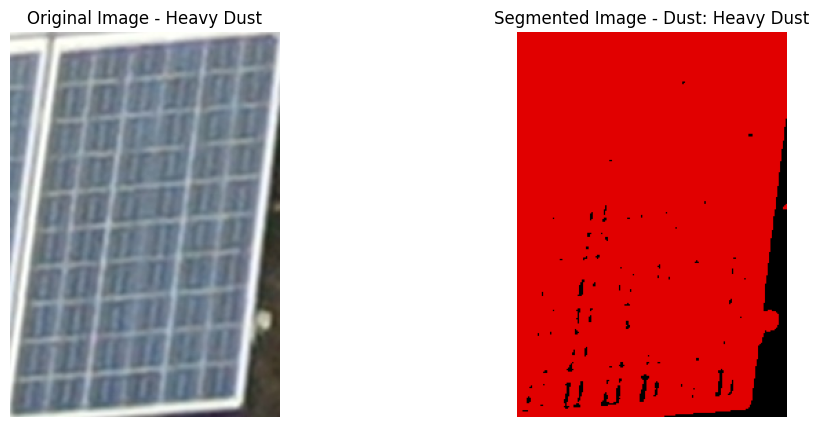

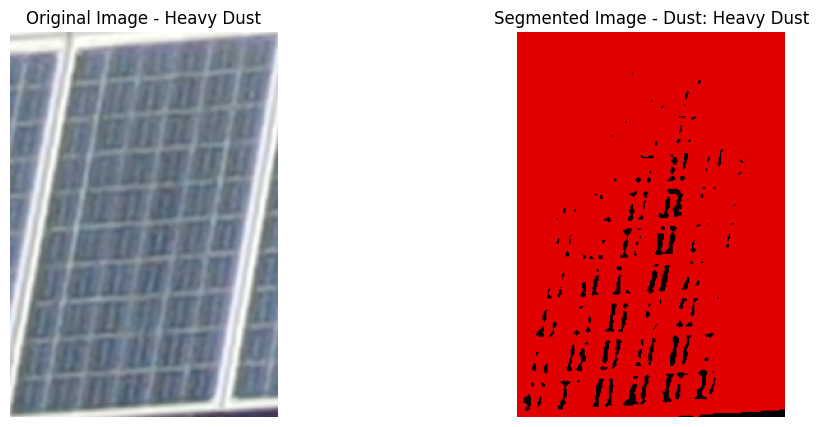

In [3]:
import numpy as np
from sklearn.cluster import KMeans
import cv2
import os
import matplotlib.pyplot as plt

# Function to extract features from an image (e.g., mean color)
def extract_features(image_path):
    image = cv2.imread(image_path)
    # Convert BGR to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Calculate the mean color of the image
    mean_color = np.mean(image, axis=(0, 1))
    return mean_color

# Function to segment the image and label dust presence
def segment_and_label_dust(image_path, cluster_to_class, kmeans):
    image = cv2.imread(image_path)
    # Convert BGR to RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Apply thresholding to segment dust
    _, binary_mask = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)  # Adjust threshold as needed

    # Create a colored mask for dust regions
    dust_mask = np.zeros_like(image_rgb)
    dust_mask[binary_mask == 255] = [225, 0, 0]  # Set dust regions to red

    # Overlay labels on the segmented image
    cluster_label = cluster_to_class.get(kmeans.predict([extract_features(image_path)])[0], "Unknown")

    return image_rgb, dust_mask, cluster_label

# Path to the folder containing the solar panel images
data_dir = "C:/Users/Lenovo/OneDrive/Documents/7th sem/EE432/Project-1/ML_Cropped"

# Create an empty list to store the features of each image
features = []
predicted_labels = []  # Initialize the predicted_labels list

# Create a dictionary to map cluster labels to class names
cluster_to_class = {0: "Clean", 1: "Moderate Dust", 2: "Heavy Dust"}

# Create a dictionary to store the top ten images for each class
top_ten_images = {0: [], 1: [], 2: []}

# Iterate through the images in the folder
for filename in os.listdir(data_dir):
    if filename.endswith(".jpg"):
        image_path = os.path.join(data_dir, filename)
        features.append(extract_features(image_path))

# Check if images were found
if len(features) == 0:
    print("No images found in the data directory.")
else:
    # Convert the list of features to a NumPy array
    features = np.array(features)

    # Number of clusters (classes) for K-Means
    num_clusters = 3

    # Apply K-Means clustering to classify the images
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    kmeans.fit(features)

    # Iterate through the images again to display segmented images with dust labels
    for i, filename in enumerate(os.listdir(data_dir)):
        if filename.endswith(".jpg"):
            image_path = os.path.join(data_dir, filename)
            image_rgb, dust_mask, cluster_label = segment_and_label_dust(image_path, cluster_to_class, kmeans)
            predicted_class = cluster_to_class[kmeans.labels_[i]]
            predicted_labels.append(predicted_class)

            # Store the segmented image in the top_ten_images dictionary
            class_label = cluster_to_class[kmeans.labels_[i]]
            if len(top_ten_images[kmeans.labels_[i]]) < 10:
                top_ten_images[kmeans.labels_[i]].append((filename, image_rgb, dust_mask, cluster_label))

    # Display the top ten segmented images for each class
    for i in range(num_clusters):
        print(f"Top ten segmented images for class '{cluster_to_class[i]}':")
        for filename, image_rgb, dust_mask, cluster_label in top_ten_images[i]:
            plt.figure(figsize=(12, 5))
            plt.subplot(1, 2, 1)
            plt.imshow(image_rgb)
            plt.title(f"Original Image - {cluster_label}")
            plt.axis('off')
            plt.subplot(1, 2, 2)
            plt.imshow(dust_mask)
            plt.title(f"Segmented Image - Dust: {cluster_label}")
            plt.axis('off')
            plt.show()
        

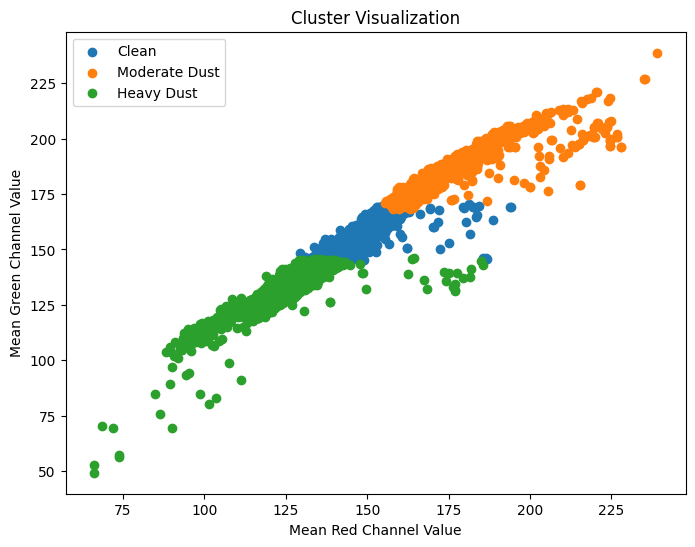

In [4]:
# Create a scatter plot to visualize the clusters
plt.figure(figsize=(8, 6))
for i in range(num_clusters):
    cluster_indices = np.where(kmeans.labels_ == i)
    cluster_features = features[cluster_indices]
    plt.scatter(cluster_features[:, 0], cluster_features[:, 1], label=cluster_to_class[i])

plt.title("Cluster Visualization")
plt.xlabel("Mean Red Channel Value")
plt.ylabel("Mean Green Channel Value")
plt.legend()
plt.show()


# Training the Gaussian Naive Bayes model with prepared data.

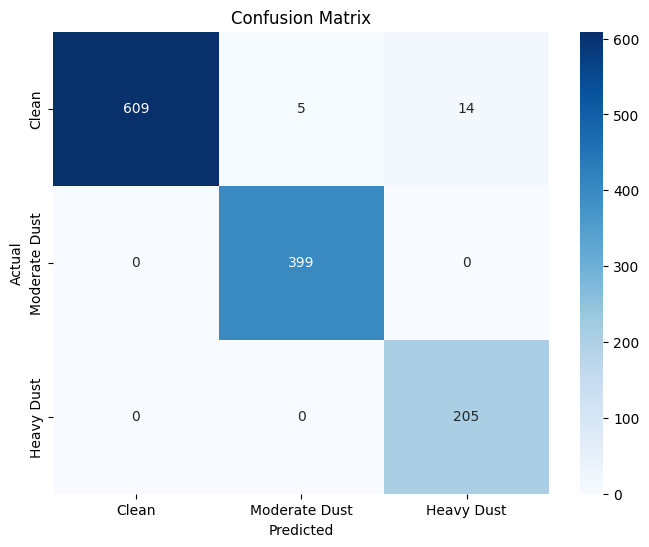

Accuracy: 0.98
F1 Score: 0.98
Classification Report:
               precision    recall  f1-score   support

        Clean       1.00      0.97      0.98       628
Moderate Dust       0.99      1.00      0.99       399
   Heavy Dust       0.94      1.00      0.97       205

     accuracy                           0.98      1232
    macro avg       0.97      0.99      0.98      1232
 weighted avg       0.99      0.98      0.98      1232



In [5]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Add K-Means cluster labels to the features
features_with_labels = np.column_stack((features, kmeans.labels_))

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(features_with_labels, predicted_labels, test_size=0.2, random_state=42)

# Initialize a Gaussian Naive Bayes classifier
naive_bayes_classifier = GaussianNB()

# Define batch size for incremental training
batch_size = 1000

# Split the training data into batches and train the model incrementally
num_samples = X_train.shape[0]
for i in range(0, num_samples, batch_size):
    X_batch = X_train[i:i+batch_size, :-1]
    y_batch = y_train[i:i+batch_size]
    
    naive_bayes_classifier.partial_fit(X_batch, y_batch, classes=np.unique(y_train))

# Make predictions on the test set
y_pred = naive_bayes_classifier.predict(X_test[:, :-1])

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=cluster_to_class.values(), yticklabels=cluster_to_class.values())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Generate a classification report
class_report = classification_report(y_test, y_pred, target_names=cluster_to_class.values())

# Print evaluation scores
print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')
print('Classification Report:')
print(class_report)


# Training the Multinomial Naive Bayes model with prepared data.

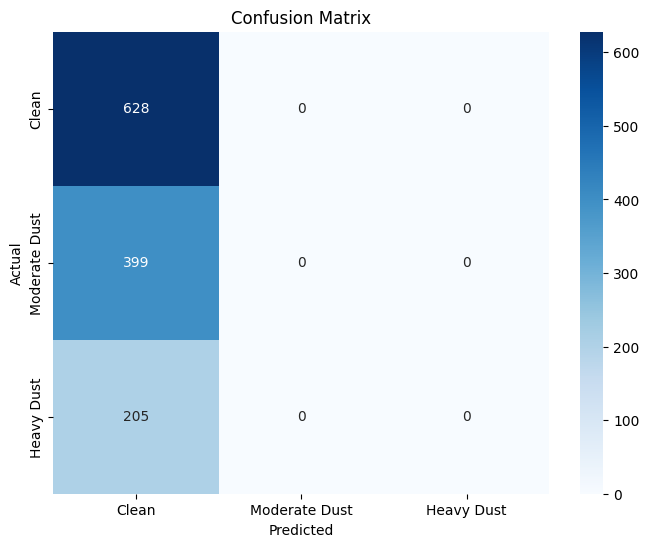

Accuracy: 0.51
F1 Score: 0.34
Classification Report:
               precision    recall  f1-score   support

        Clean       0.51      1.00      0.68       628
Moderate Dust       0.00      0.00      0.00       399
   Heavy Dust       0.00      0.00      0.00       205

     accuracy                           0.51      1232
    macro avg       0.17      0.33      0.23      1232
 weighted avg       0.26      0.51      0.34      1232



C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

In [6]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB  # Import MultinomialNB
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Add K-Means cluster labels to the features
features_with_labels = np.column_stack((features, kmeans.labels_))

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(features_with_labels, predicted_labels, test_size=0.2, random_state=42)

# Initialize a Multinomial Naive Bayes classifier
naive_bayes_classifier = MultinomialNB()  # Use MultinomialNB

# Define batch size for incremental training
batch_size = 1000

# Split the training data into batches and train the model incrementally
num_samples = X_train.shape[0]
for i in range(0, num_samples, batch_size):
    X_batch = X_train[i:i+batch_size, :-1]
    y_batch = y_train[i:i+batch_size]

    naive_bayes_classifier.partial_fit(X_batch, y_batch, classes=np.unique(y_train))

# Make predictions on the test set
y_pred = naive_bayes_classifier.predict(X_test[:, :-1])

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=cluster_to_class.values(), yticklabels=cluster_to_class.values())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Generate a classification report
class_report = classification_report(y_test, y_pred, target_names=cluster_to_class.values())

# Print evaluation scores
print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')
print('Classification Report:')
print(class_report)


# Training the Bernoulli Naive Bayes model with prepared data.

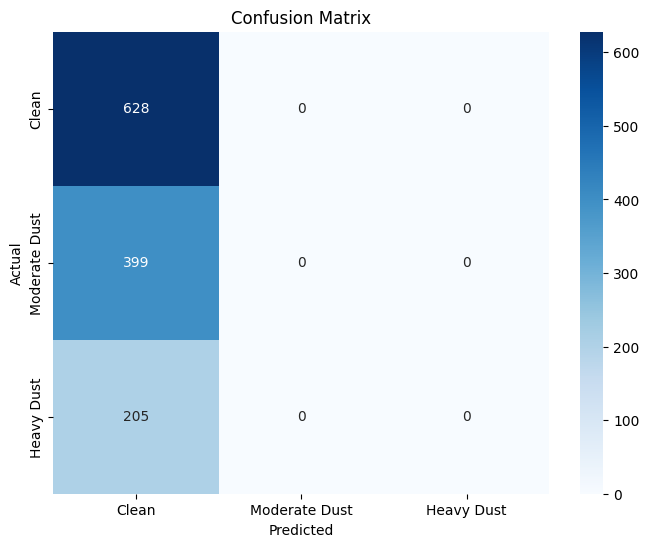

Accuracy: 0.51
F1 Score: 0.34
Classification Report:
               precision    recall  f1-score   support

        Clean       0.51      1.00      0.68       628
Moderate Dust       0.00      0.00      0.00       399
   Heavy Dust       0.00      0.00      0.00       205

     accuracy                           0.51      1232
    macro avg       0.17      0.33      0.23      1232
 weighted avg       0.26      0.51      0.34      1232



C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

In [7]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB  # Change this import
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Add K-Means cluster labels to the features
features_with_labels = np.column_stack((features, kmeans.labels_))

# Binarize the feature data since Bernoulli Naive Bayes expects binary data
features_with_labels = (features_with_labels > 0).astype(int)

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(features_with_labels, predicted_labels, test_size=0.2, random_state=42)

# Initialize a Bernoulli Naive Bayes classifier
naive_bayes_classifier = BernoulliNB()  # Change the classifier type

# Define batch size for incremental training
batch_size = 1000

# Split the training data into batches and train the model incrementally
num_samples = X_train.shape[0]
for i in range(0, num_samples, batch_size):
    X_batch = X_train[i:i+batch_size, :-1]
    y_batch = y_train[i:i+batch_size]
    
    naive_bayes_classifier.partial_fit(X_batch, y_batch, classes=np.unique(y_train))

# Make predictions on the test set
y_pred = naive_bayes_classifier.predict(X_test[:, :-1])

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=cluster_to_class.values(), yticklabels=cluster_to_class.values())
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)

# Calculate F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Generate a classification report
class_report = classification_report(y_test, y_pred, target_names=cluster_to_class.values())

# Print evaluation scores
print(f'Accuracy: {accuracy:.2f}')
print(f'F1 Score: {f1:.2f}')
print('Classification Report:')
print(class_report)


# Preparing and Classifying the images According to the age of the panel.

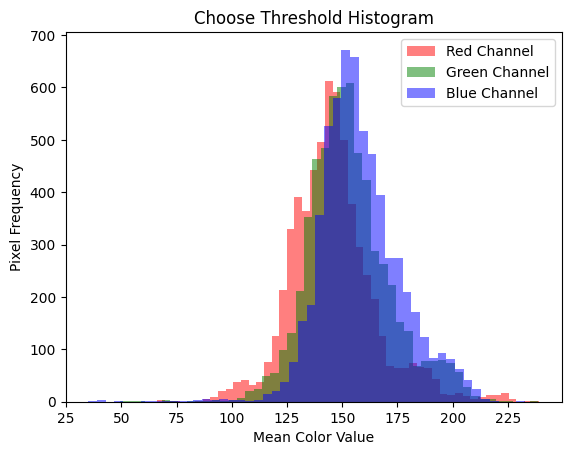

RMS Threshold: 147.07412031164418
Average Threshold: 145.76608776814314


In [8]:
# Function to extract features from an image (e.g., mean color)
def extract_features2(image_path):
    try:
        # Read the image
        image = cv2.imread(image_path)
        
        # Convert BGR to RGB
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Calculate the mean color of the image
        mean_color = np.mean(image, axis=(0, 1))
        return mean_color
    except Exception as e:
        print(f"Error processing {image_path}: {str(e)}")
        return None

# Create empty lists to store the features and file names
features2 = []
file_names2 = []

# Iterate through the images in the folder
for filename in os.listdir(data_dir):
    if filename.endswith(".jpg"):
        image_path = os.path.join(data_dir, filename)
        try:
            features2.append(extract_features2(image_path))
            file_names2.append(filename)
        except Exception as e:
            print(f"Error processing {filename}: {str(e)}")

# Check if there are valid images to process
if not features2:
    print("No valid image files found in the specified folder.")
else:
    # Create an array of features
    features2 = np.array(features2)
    
    # Define the number of bins for the histogram
    num_bins = 50  # You can adjust this value as needed
    
    # Create a histogram plot for choosing the threshold
    plt.hist(features2[:, 0], bins=num_bins, alpha=0.5, color='r', label='Red Channel')
    plt.hist(features2[:, 1], bins=num_bins, alpha=0.5, color='g', label='Green Channel')
    plt.hist(features2[:, 2], bins=num_bins, alpha=0.5, color='b', label='Blue Channel')
    
    plt.title("Choose Threshold Histogram")
    plt.xlabel("Mean Color Value")
    plt.ylabel("Pixel Frequency")
    plt.legend(loc='upper right')

    plt.show()

    # Calculate RMS and average threshold
    threshold_values2 = features2[:, 0]
    rms_threshold2 = np.sqrt(np.mean(threshold_values2 ** 2))
    average_threshold2 = np.mean(threshold_values2)

    print(f"RMS Threshold: {rms_threshold2}")
    print(f"Average Threshold: {average_threshold2}")

    # Choose the threshold value interactively
    threshold = rms_threshold2

    # Classify panels based on the chosen threshold
    predicted_labels = ["New" if feature[0] > threshold else "Old" for feature in features2]

# Training the Gaussian Naive Bayes model with prepared data.

Classification Report:
              precision    recall  f1-score   support

         New       0.96      0.88      0.92       539
         Old       0.91      0.97      0.94       693

    accuracy                           0.93      1232
   macro avg       0.94      0.93      0.93      1232
weighted avg       0.93      0.93      0.93      1232



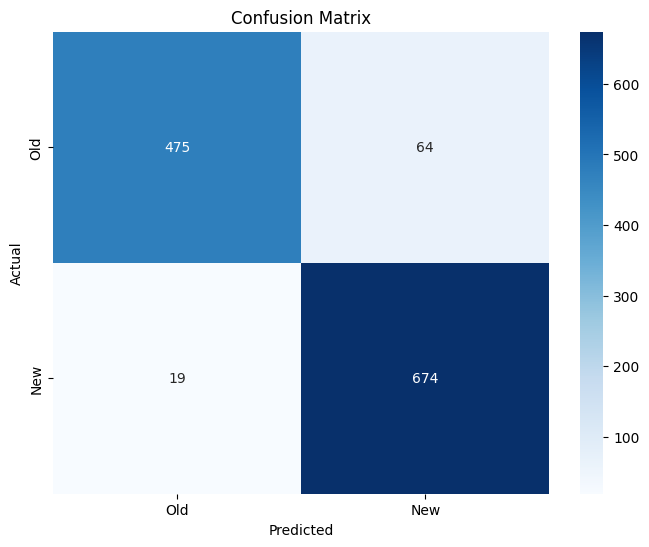

Accuracy: 0.93
Precision: 0.96
Recall: 0.88
F1 Score: 0.92


In [9]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load or generate your dataset into features2 and predicted_labels

# Initialize the Gaussian Naive Bayes classifier
naive_bayes_classifier = GaussianNB()

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(features2, predicted_labels, test_size=0.2, random_state=42)

# Chunk size for partial fitting
chunk_size = 1000  # Adjust this based on your system's memory capacity

# Train the Naive Bayes classifier in chunks
for i in range(0, len(X_train), chunk_size):
    X_chunk = X_train[i:i+chunk_size]
    y_chunk = y_train[i:i+chunk_size]
    naive_bayes_classifier.partial_fit(X_chunk, y_chunk, classes=np.unique(y_train))

# Make predictions on the test data
y_pred = naive_bayes_classifier.predict(X_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Old", "New"], yticklabels=["Old", "New"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class
recall = recall_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class
f1 = f1_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class

# Print evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")


# Training the Multinomial Naive Bayes model with prepared data.

Classification Report:
              precision    recall  f1-score   support

         New       0.96      0.05      0.10       539
         Old       0.57      1.00      0.73       693

    accuracy                           0.58      1232
   macro avg       0.77      0.52      0.41      1232
weighted avg       0.75      0.58      0.45      1232



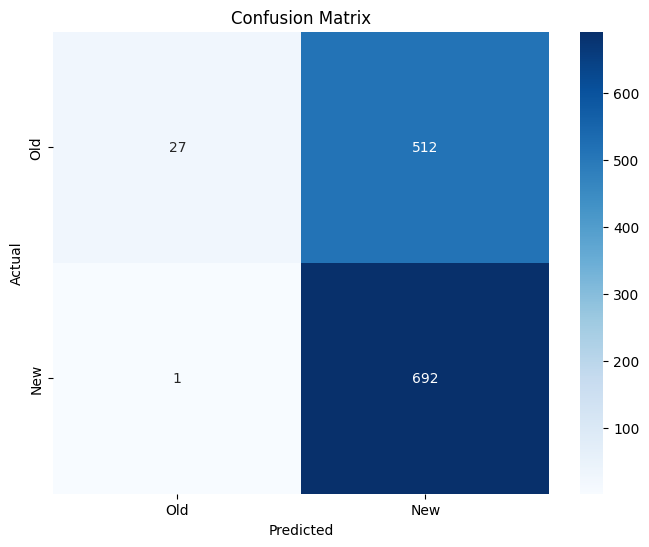

Accuracy: 0.58
Precision: 0.96
Recall: 0.05
F1 Score: 0.10


In [10]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB  # Import MultinomialNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load or generate your dataset into features2 and predicted_labels

# Initialize the Multinomial Naive Bayes classifier
naive_bayes_classifier = MultinomialNB()

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(features2, predicted_labels, test_size=0.2, random_state=42)

# Chunk size for partial fitting
chunk_size = 1000  # Adjust this based on your system's memory capacity

# Train the Naive Bayes classifier in chunks
for i in range(0, len(X_train), chunk_size):
    X_chunk = X_train[i:i+chunk_size]
    y_chunk = y_train[i:i+chunk_size]
    naive_bayes_classifier.partial_fit(X_chunk, y_chunk, classes=np.unique(y_train))

# Make predictions on the test data
y_pred = naive_bayes_classifier.predict(X_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Old", "New"], yticklabels=["Old", "New"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class
recall = recall_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class
f1 = f1_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class

# Print evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")


# Training the Bernoulli Naive Bayes model with prepared data.

Classification Report:
              precision    recall  f1-score   support

         New       0.00      0.00      0.00       539
         Old       0.56      1.00      0.72       693

    accuracy                           0.56      1232
   macro avg       0.28      0.50      0.36      1232
weighted avg       0.32      0.56      0.40      1232



C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

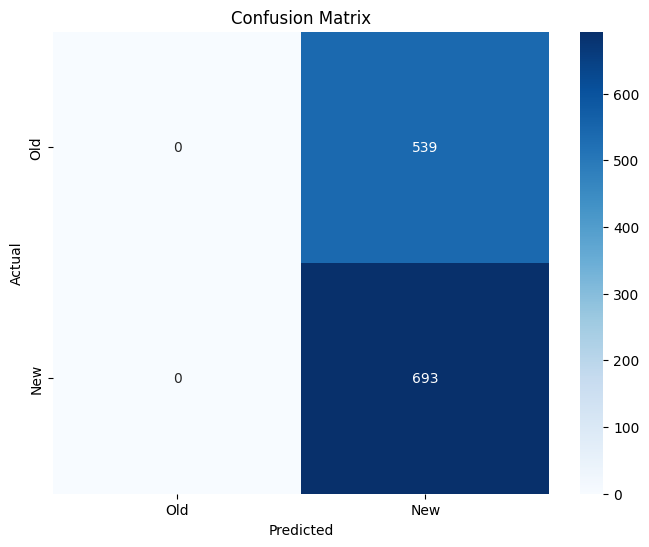

Accuracy: 0.56
Precision: 0.00
Recall: 0.00
F1 Score: 0.00


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [11]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB  # Import BernoulliNB
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# Load or generate your dataset into features2 and predicted_labels

# Initialize the Bernoulli Naive Bayes classifier
naive_bayes_classifier = BernoulliNB()  # Use BernoulliNB

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(features2, predicted_labels, test_size=0.2, random_state=42)

# Chunk size for partial fitting
chunk_size = 1000  # Adjust this based on your system's memory capacity

# Train the Naive Bayes classifier in chunks
for i in range(0, len(X_train), chunk_size):
    X_chunk = X_train[i:i+chunk_size]
    y_chunk = y_train[i:i+chunk_size]
    naive_bayes_classifier.partial_fit(X_chunk, y_chunk, classes=np.unique(y_train))

# Make predictions on the test data
y_pred = naive_bayes_classifier.predict(X_test)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Old", "New"], yticklabels=["Old", "New"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class
recall = recall_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class
f1 = f1_score(y_test, y_pred, pos_label='New')  # 'New' is the positive class

# Print evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")


# Preparing and Classifying the images According to the Sunlight percentage on the panel.

Average Sunlight Percentage: 13.45
RMS Sunlight Percentage: 16.44
Median Sunlight Percentage: 12.84


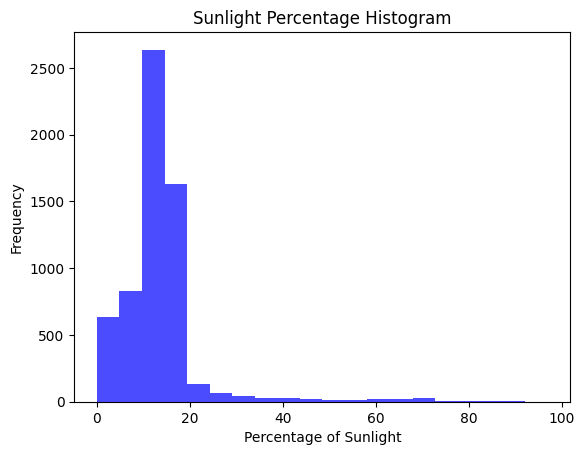

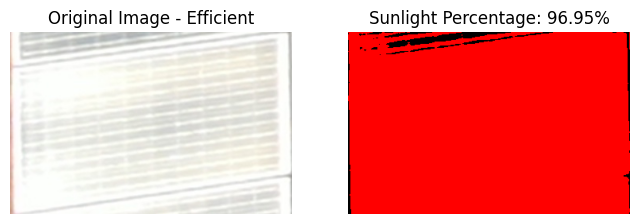

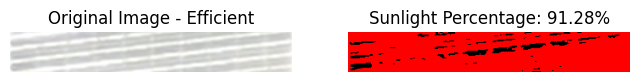

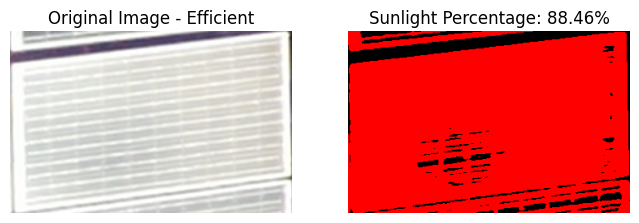

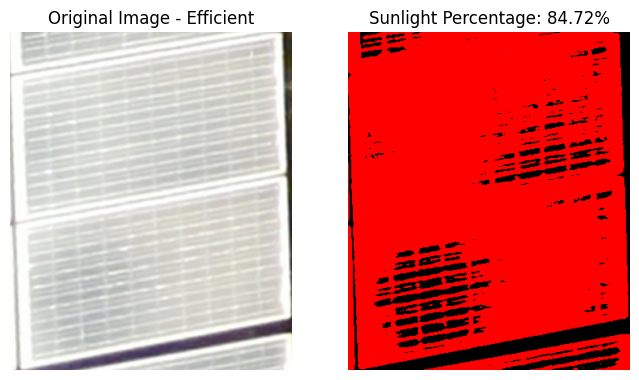

...

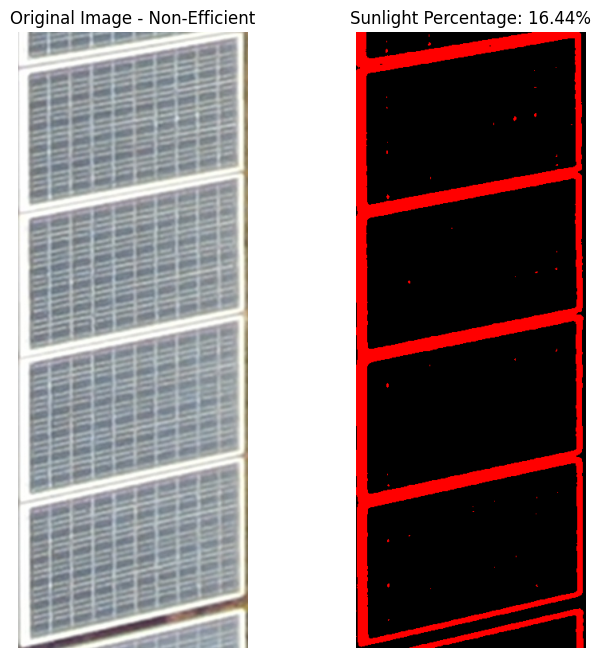

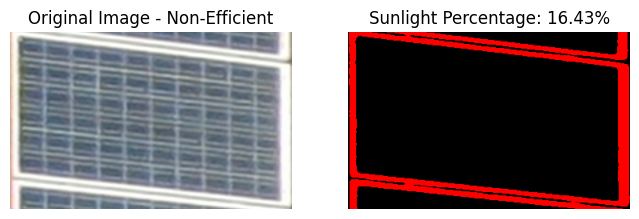

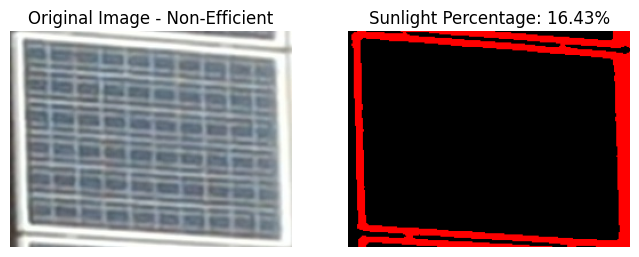

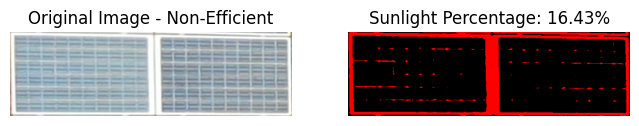

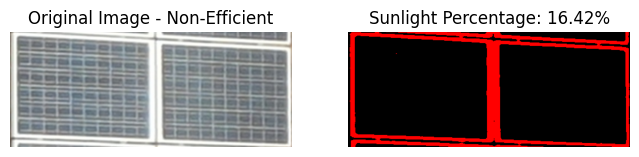

In [18]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the percentage of sunlight exposure
def calculate_sunlight(image):
    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply thresholding to create a binary mask (adjust threshold value as needed)
    _, binary_mask = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)

    # Calculate the percentage of white pixels in the binary mask
    total_pixels = image.shape[0] * image.shape[1]
    white_pixels = cv2.countNonZero(binary_mask)
    percentage_sunlight = (white_pixels / total_pixels) * 100

    return percentage_sunlight

# Path to the folder containing the solar panel images
data_dir = "C:/Users/Lenovo/OneDrive/Documents/7th sem/EE432/Project-1/ML_Cropped"

# Create empty lists to store sunlight percentages and file names
sunlight_percentages = []
file_names = []

# Iterate through the images in the folder
for filename in os.listdir(data_dir):
    if filename.endswith(".jpg"):
        image_path = os.path.join(data_dir, filename)
        try:
            # Read the image
            image = cv2.imread(image_path)

            # Calculate sunlight percentage
            sunlight_percentage = calculate_sunlight(image)

            # Append to the lists
            sunlight_percentages.append(sunlight_percentage)
            file_names.append(filename)
        except Exception as e:
            print(f"Error processing {filename}: {str(e)}")

# Check if there are valid images to process
if not sunlight_percentages:
    print("No valid image files found in the specified folder.")
else:
    # Create a list of (sunlight percentage, filename) pairs
    data = list(zip(sunlight_percentages, file_names))
    # Sort the data by sunlight percentage in descending order
    data.sort(reverse=True)

    # Display the average, RMS, and median sunlight percentages
    average_sunlight = np.mean(sunlight_percentages)
    rms_sunlight = np.sqrt(np.mean(np.array(sunlight_percentages) ** 2))
    median_sunlight = np.median(sunlight_percentages)

    print(f"Average Sunlight Percentage: {average_sunlight:.2f}")
    print(f"RMS Sunlight Percentage: {rms_sunlight:.2f}")
    print(f"Median Sunlight Percentage: {median_sunlight:.2f}")

    # Separate the data into Efficient and Non-Efficient classes based on a threshold
    threshold = rms_sunlight
    efficient_images = [item for item in data if item[0] >= threshold][:5]
    non_efficient_images = [item for item in data if item[0] < threshold][:5]

    # Create a histogram of sunlight percentages
    plt.hist(sunlight_percentages, bins=20, color='b', alpha=0.7)
    plt.title("Sunlight Percentage Histogram")
    plt.xlabel("Percentage of Sunlight")
    plt.ylabel("Frequency")
    plt.show()

    # Store classified labels in an array
    classified_labels = ["Efficient" if item[0] >= threshold else "Non-Efficient" for item in data]

    # Display the top 5 and bottom 5 segmented images with their original images
    top_and_bottom_images = efficient_images + non_efficient_images
    for percentage, filename in top_and_bottom_images:
        image = cv2.imread(os.path.join(data_dir, filename))
        plt.figure(figsize=(8, 8))
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        plt.title(f"Original Image - {classified_labels[data.index((percentage, filename))]}")
        plt.axis('off')

        # Create a red mask to highlight sunlight regions
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        _, binary_mask = cv2.threshold(gray, 200, 255, cv2.THRESH_BINARY)
        red_mask = np.zeros_like(image)
        red_mask[binary_mask == 255] = [0, 0, 255]  # Set sunlight regions to red

        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(red_mask, cv2.COLOR_BGR2RGB))
        plt.title(f"Sunlight Percentage: {percentage:.2f}%")
        plt.axis('off')

        plt.show()


# Training the Gaussian Naive Bayes model with prepared data.

Accuracy: 0.80
Precision (Efficient): 0.48
Recall (Efficient): 0.05
F1 Score (Efficient): 0.10
Precision (Non-Efficient): 0.81
Recall (Non-Efficient): 0.99
F1 Score (Non-Efficient): 0.89


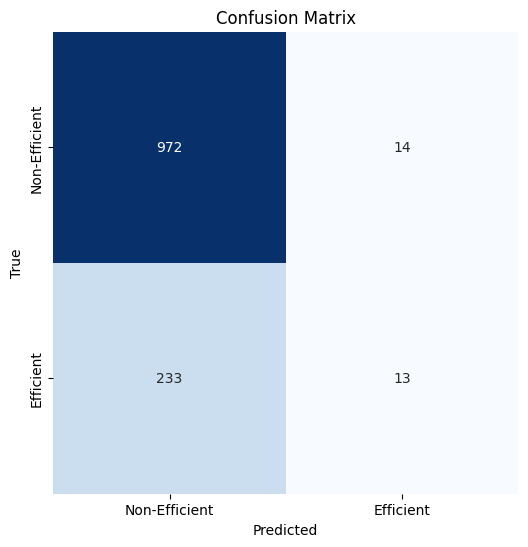

               precision    recall  f1-score   support

Non-Efficient       0.48      0.05      0.10       246
    Efficient       0.81      0.99      0.89       986

     accuracy                           0.80      1232
    macro avg       0.64      0.52      0.49      1232
 weighted avg       0.74      0.80      0.73      1232



In [20]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load or generate your large dataset (sunlight_percentages3 and classified_labels)
# Ensure you have enough memory to handle the data

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(sunlight_percentages, classified_labels, test_size=0.2, random_state=42)

# Create and train a Naive Bayes classifier
classifier = GaussianNB()

# Fit the classifier
classifier.fit(np.array(X_train).reshape(-1, 1), y_train)

# Predict the classes on the testing data
y_pred = classifier.predict(np.array(X_test).reshape(-1, 1))

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)

# Compute precision, recall, and f1-score for both classes
precision_efficient = precision_score(y_test, y_pred, pos_label='Efficient')
recall_efficient = recall_score(y_test, y_pred, pos_label='Efficient')
f1_efficient = f1_score(y_test, y_pred, pos_label='Efficient')

precision_non_efficient = precision_score(y_test, y_pred, pos_label='Non-Efficient')
recall_non_efficient = recall_score(y_test, y_pred, pos_label='Non-Efficient')
f1_non_efficient = f1_score(y_test, y_pred, pos_label='Non-Efficient')

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision (Efficient): {precision_efficient:.2f}")
print(f"Recall (Efficient): {recall_efficient:.2f}")
print(f"F1 Score (Efficient): {f1_efficient:.2f}")
print(f"Precision (Non-Efficient): {precision_non_efficient:.2f}")
print(f"Recall (Non-Efficient): {recall_non_efficient:.2f}")
print(f"F1 Score (Non-Efficient): {f1_non_efficient:.2f}")

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred, labels=['Non-Efficient', 'Efficient'])
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Non-Efficient', 'Efficient'], yticklabels=['Non-Efficient', 'Efficient'])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Print the classification report
report = classification_report(y_test, y_pred, target_names=['Non-Efficient', 'Efficient'])
print(report)


# Training the Bernoulli Naive Bayes model with prepared data.

Accuracy: 0.80
Precision (Efficient): 0.00
Recall (Efficient): 0.00
F1 Score (Efficient): 0.00
Precision (Non-Efficient): 0.80
Recall (Non-Efficient): 1.00
F1 Score (Non-Efficient): 0.89


C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


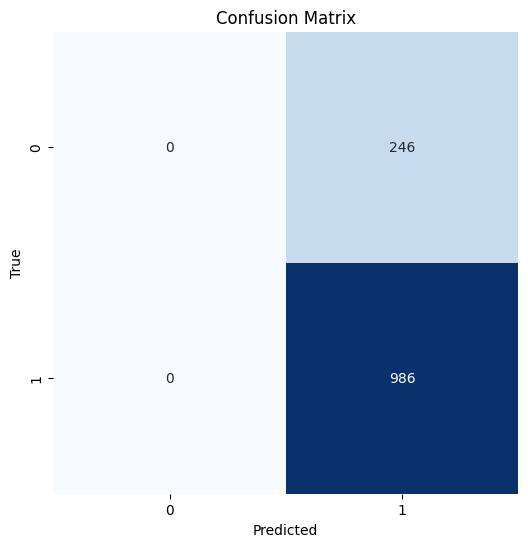

               precision    recall  f1-score   support

Non-Efficient       0.00      0.00      0.00       246
    Efficient       0.80      1.00      0.89       986

     accuracy                           0.80      1232
    macro avg       0.40      0.50      0.44      1232
 weighted avg       0.64      0.80      0.71      1232



C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

In [14]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load or generate your large dataset (sunlight_percentages and classified_labels)
# Ensure you have enough memory to handle the data

# Convert lists to NumPy arrays
sunlight_percentages = np.array(sunlight_percentages)
classified_labels = np.array(classified_labels)

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(sunlight_percentages, classified_labels, test_size=0.2, random_state=42)

# Binarize the feature data since Bernoulli Naive Bayes expects binary data
X_train = (X_train > X_train.mean()).astype(int)
X_test = (X_test > X_test.mean()).astype(int)

# Reshape X_train and X_test to 2D arrays
X_train = X_train.reshape(-1, 1)
X_test = X_test.reshape(-1, 1)

# Create and train a Bernoulli Naive Bayes classifier
classifier = BernoulliNB()

# Fit the classifier
classifier.fit(X_train, y_train)

# Predict the classes on the testing data
y_pred = classifier.predict(X_test)

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)

# Compute precision, recall, and f1-score for both classes
precision_efficient = precision_score(y_test, y_pred, pos_label='Efficient')
recall_efficient = recall_score(y_test, y_pred, pos_label='Efficient')
f1_efficient = f1_score(y_test, y_pred, pos_label='Efficient')

precision_non_efficient = precision_score(y_test, y_pred, pos_label='Non-Efficient')
recall_non_efficient = recall_score(y_test, y_pred, pos_label='Non-Efficient')
f1_non_efficient = f1_score(y_test, y_pred, pos_label='Non-Efficient')

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision (Efficient): {precision_efficient:.2f}")
print(f"Recall (Efficient): {recall_efficient:.2f}")
print(f"F1 Score (Efficient): {f1_efficient:.2f}")
print(f"Precision (Non-Efficient): {precision_non_efficient:.2f}")
print(f"Recall (Non-Efficient): {recall_non_efficient:.2f}")
print(f"F1 Score (Non-Efficient): {f1_non_efficient:.2f}")

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Print the classification report
report = classification_report(y_test, y_pred, target_names=['Non-Efficient', 'Efficient'])
print(report)


# Training the Multinomial Naive Bayes model with prepared data.

C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.80
Precision (Efficient): 0.00
Recall (Efficient): 0.00
F1 Score (Efficient): 0.00
Precision (Non-Efficient): 0.80
Recall (Non-Efficient): 1.00
F1 Score (Non-Efficient): 0.89


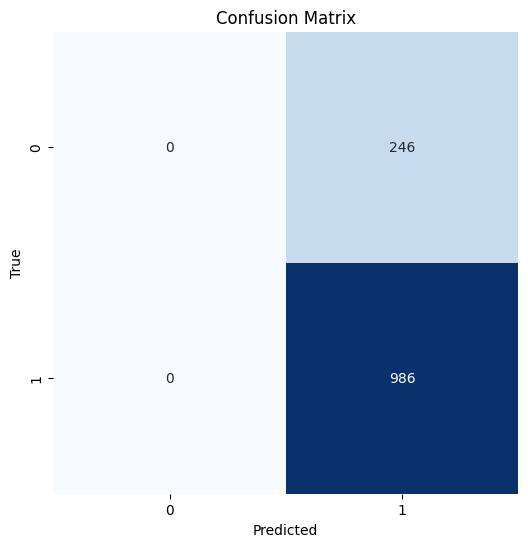

               precision    recall  f1-score   support

Non-Efficient       0.00      0.00      0.00       246
    Efficient       0.80      1.00      0.89       986

     accuracy                           0.80      1232
    macro avg       0.40      0.50      0.44      1232
 weighted avg       0.64      0.80      0.71      1232



C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Lenovo\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(avera

In [15]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB  # Change this import
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# Load or generate your large dataset (sunlight_percentages3 and classified_labels)
# Ensure you have enough memory to handle the data

# Split the data into training (80%) and testing (20%) sets
X_train, X_test, y_train, y_test = train_test_split(sunlight_percentages, classified_labels, test_size=0.2, random_state=42)

# Create and train a Multinomial Naive Bayes classifier
classifier = MultinomialNB()  # Change the classifier type

# Reshape the data to be 2D
X_train = X_train.reshape(-1, 1)
X_test = X_test.reshape(-1, 1)

# Fit the classifier
classifier.fit(X_train, y_train)  # No need to reshape the data for Multinomial Naive Bayes

# Predict the classes on the testing data
y_pred = classifier.predict(X_test)  # No need to reshape the data for prediction

# Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)

# Compute precision, recall, and f1-score for both classes
precision_efficient = precision_score(y_test, y_pred, pos_label='Efficient')
recall_efficient = recall_score(y_test, y_pred, pos_label='Efficient')
f1_efficient = f1_score(y_test, y_pred, pos_label='Efficient')

precision_non_efficient = precision_score(y_test, y_pred, pos_label='Non-Efficient')
recall_non_efficient = recall_score(y_test, y_pred, pos_label='Non-Efficient')
f1_non_efficient = f1_score(y_test, y_pred, pos_label='Non-Efficient')

# Print the evaluation metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Precision (Efficient): {precision_efficient:.2f}")
print(f"Recall (Efficient): {recall_efficient:.2f}")
print(f"F1 Score (Efficient): {f1_efficient:.2f}")
print(f"Precision (Non-Efficient): {precision_non_efficient:.2f}")
print(f"Recall (Non-Efficient): {recall_non_efficient:.2f}")
print(f"F1 Score (Non-Efficient): {f1_non_efficient:.2f}")

# Plot the confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Print the classification report
report = classification_report(y_test, y_pred, target_names=['Non-Efficient', 'Efficient'])
print(report)
